<a href="https://colab.research.google.com/github/FilippoAleotti/SistemiDigitaliM/blob/master/PyTorch/neural_stile_transfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This Colab notebook shows how to build a Neural Style Transfer solution using PyTorch Lightning.

**Disclaimer**: there are some discrepancies between this implementation and the original one (e.g., the optimizer). The current implementation is for demonstration purposes only. 

# Neural Style Transfer

Sometimes we would apply a certain style to a given image. This problem is known in computer vision as style transfer.

Even if there exist many different solutions (such as the **color transfer** technique proposed by [Reinhard et al](https://ieeexplore.ieee.org/document/946629) and available on Colab [![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/FilippoAleotti/ColorTransfer/blob/main/color_transfer_demo.ipynb) ), Deep Learning proved to be great to tackle this challenging problem.

In 2015, [Gatys et al](https://arxiv.org/pdf/1508.06576.pdf) noticed that:
* deep neural networks are able to extract content information from image, such as structures or edges
* the content and the style can be detached

This paper paved the way to neural style transfer applications.

## Neural Style Transfer
The idea is the following: given two images, the `content` and the `style` image respectively, we aim to create a new image, called `target`, with the content (in terms of structures etc) aligned with the `content` image but with the style (in terms of colors, specific features) of the `style` one. 

 <figure align="center">
  <img src="https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcR-TANhdLgAwXzB3GPXapuL9kGB-8WD1DFHzA&usqp=CAU" width="500" />
  <figcaption>Content image: center of Bologna</figcaption>
</figure>
<figure align="center">
  <img src="https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/300px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg" width="500" />
  <figcaption>Style image: Van Gogh's starry night</figcaption>
</figure>


The `target` image is initialized with random values (white noise), but during our training, we perform backprop on it to obtain the desired result. At test time we just visualize the `target` image.

<p align="center">
  <img src="https://github.com/FilippoAleotti/SistemiDigitaliM/blob/master/PyTorch/neural_style_transfer.gif?raw=true" />
</p>

We use a pre-trained neural network to extract features from the `content`, `style` and `target` image: the authors proposed to use a [VGG19](https://arxiv.org/pdf/1409.1556.pdf) model pre-trained on [ImageNet dataset](http://www.image-net.org/), a popular image classification dataset, because it is already able to handle images and their content. The figure below depicts the VGG19 model architecture.

<figure align="center">
  <img src="https://www.researchgate.net/profile/Clifford_Yang/publication/325137356/figure/fig2/AS:670371271413777@1536840374533/llustration-of-the-network-architecture-of-VGG-19-model-conv-means-convolution-FC-means.jpg" />
  <figcaption>Target image during the training. We are taking the content from the `content` picture, but we are applying the style of the `style` one.</figcaption>
</figure>

Given the pre-trained model and an image we can feed the model with the image and obtain a set of feature maps. Depending on the level, the extracted feature map may contain information at high (e.g., edges) or low (more complex features) level. In the picture below there are depticted the activations of the first and the fifth conv layers of [AlexNet](https://papers.nips.cc/paper/2012/file/c399862d3b9d6b76c8436e924a68c45b-Paper.pdf) neural network given the picture of a cat. A more detailed description [here](https://cs231n.github.io/understanding-cnn/) 

<p float="left" align="center">
  <img src="https://cs231n.github.io/assets/cnnvis/act1.jpeg" width="500" />
  <img src="https://cs231n.github.io/assets/cnnvis/act2.jpeg" width="500" /> 
</p>

### Content Loss
To obtain a realistic `target` image in terms of content, we can minimize the difference between features extracted from the `content` image and the `target` one at each training step. This because the features contain spatial information about the scene, and `target` must preserve the structure of the scene. Thus, we can minimize the Mean Squared Error between `target` and `content` features for each feature map extracted al level $l$ of the model:

$\mathcal{L}^l_{c} = \frac{\sum\limits_{i}^{N}(\Phi_l(\text{content})_i - \Phi_l(\text{target})_i)^2}{N}$

where:

* $\Phi_l$ is the feature map at level *i* provided the pre-trained VGG19 model 
* N is the number of channels in the feature map

The content loss is the sum of of the $\mathcal{L}^l_{c}$ computed for each layer in charge of content extraction, weighted by $\alpha_{c}$

$\mathcal{L}_c = \alpha_{c}\sum\limits_{l} \mathcal{L}^l_{c}$
### Style Loss
On the other hand, the style does not depend on the spatial structures and their arrangement, but only on the colors, textures and distinctive features. For this reason, the authors proposed to apply the Mean Squared Error on the Gram matrix of the features to obtain a style error loss to minimize.

The [Gram matrix](https://en.wikipedia.org/wiki/Gramian_matrix#:~:text=In%20quantum%20chemistry%2C%20the%20Gram,vectors%20is%20the%20overlap%20matrix.&text=In%20the%20finite%20element%20method,of%20the%20finite%20dimensional%20subspace) $G$ of a given matrix $F$ is the matrix multiplication between $F$ and its trasposed.

$G_{ij} = \sum\limits_{k} F_{ik} F_{jk}$

The Gram matrix tell us how much two features are correlated (i.e. high values if a feature channel is related to another feature channel), so what we desire is a similar activation pattern between the `target` and the `style` images.
We can thus minimize the Mean Squared Error between gram matrix of target and style images for each layer $p$ in charge of style.   

$\mathcal{L}^p_{s} =  \alpha_s^p \frac{\sum\limits_{i}^{N}(G(\Phi_p(\text{content})_i) - G(\Phi_p(\text{target})_i))^2}{N}$

where:
* $G$ is the Gram matrix computed for a feature map
* $\alpha_{s}^l$ is a weight specific for layer $l$ 

Notice that $p$ and $l$ may be different set of layers.

Similarly to content loss, the final style loss is computed as:

$\mathcal{L}_s = \alpha_{s}\sum\limits_{p} \mathcal{L}^p_{s}$

### Final loss
The final loss we minimize is the sum of the two terms

$\mathcal{L} = \mathcal{L}_c + \mathcal{L}_s$






# Coding

We load dependencies.
Notice that we can install them using pip if not already available.
For instance, PyTorch Lightning is not available so we install it with:

```
!pip install pytorch-lightning
```

In [ ]:
# Copyright 2020 Filippo Aleotti
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

import os
import torch
import torchvision
import torch
from torch.utils.data import Dataset, DataLoader

import torchvision.models as models
from torchvision import transforms

!pip install pytorch-lightning
import pytorch_lightning as pl
from pytorch_lightning.loggers import TensorBoardLogger
%load_ext tensorboard

import numpy as np
import cv2
from PIL import Image

import urllib.request as urllib
import copy

from matplotlib import pyplot as plt 

We have to create our module in charge of data loading.
Notice that in this case we have to load at each iteration just two images:
* the content image
* the style image

For this reason, in our setup we perform a single training step for each epoch. We could simplify the code, however this configuration (i.e., a specific dataloader in charge of prepare data used at training or even test time) is the most used in general.

This loader downloads from internet two images (the content and the style) given their urls if images are not available, and store them in cache for further training steps.

We apply the following transformations:
* `resize`: we resize images to have known size images
* `ToTensor`: we map each image in the [0,1] range and we turn np.arrays into torch.Tensor
* `Normalize`: we apply ImageNet channel-wise normalization. This because we are going to use a pre-trained model on ImageNet, so the network is used to see normalized images.
* `expand_batch_size`: we turn 3 dims tensors into 4 dims, adding the batch size dimension with value 1.

In [ ]:
class ImageDataset(Dataset):
    """Dataset"""

    def __init__(self, content_url: str, style_url: str, shape):
        """Build a Dataloader to iteratively load a content and a style images.
        First time images are downloaded using their urls, and saved in cache.

        NOTE: Since we use VGG19 network pre-trained on ImageNet, we have to normalize
        images using the ImageNet mean and variance for each channel.

        Params:
            content_url (str): url to the content image
            style_url (str): url to the style image
            shape (tuple): (height, width) of the resized image
        """
        super(ImageDataset, self).__init__()

        self.content = [content_url]
        self.style = [style_url]
        self.downloaded = False
        self.shape = shape
        self.data_transforms = transforms.Compose(
            [
                transforms.Resize(size=self.shape),
                transforms.ToTensor(),
                transforms.Normalize(
                    mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]
                ),
                self.expand_batch_size,
            ]
        )

    def expand_batch_size(self, tensor: torch.Tensor):
        """Add a new dimension, to simulate a batch size of 1

        Params:
            tensor (torch.Tensor): tensor with shape CxHxW

        Returns:
            a torch.Tensor with shape 1xCxHxW
        """
        return tensor.unsqueeze(0)

    def __getitem__(self, index: int):
        """Get content and style images"""
        if not self.downloaded:
            # NOTE: first time we load images from urls and we save them locally
            content = self._load_img_from_url(self.content[index])
            style = self._load_img_from_url(self.style[index])
            self.content = [content]
            self.style = [style]
            self.downloaded = True
        else:
            content = self.content[index]
            style = self.style[index]

        # torchvision requires PIL.Image objects instead of numpy arrays
        content = Image.fromarray(content)
        style = Image.fromarray(style)

        # apply transformations, like Resize and move PIL.Image into torch.Tensor object.
        # Moreover, we apply also image normalization using ImageNet channel-wise mean and variance
        content = self.data_transforms(content)
        style = self.data_transforms(style)

        return content, style

    def __len__(self):
        return len(self.style)

    def _load_img_from_url(self, url: str):
        """Load an image from the web

        Params:
            url (str): url to the image

        Returns:
            a numpy.ndarray of the image, as RGB HxWx3 image

        Example:
            >>> image = self._load_img_from_url(url)
            >>> print(image.shape)
        """
        resp = urllib.urlopen(url)
        img = np.asarray(bytearray(resp.read()), dtype=np.uint8)
        img = cv2.imdecode(img, cv2.IMREAD_COLOR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        return img


We also build two `torch.nn.Module` in charge of ImageNet normalization and de-normalization. In particular:
* We use the `Normalization` module is quite similar to `torchvision.transform.Normalize`. While we use `torchvision.transform.Normalize` to apply ImageNet normalization in the dataloader, we use our module to normalize the `target` image.
* We use the `Denormalization` module to visualize normalize images: in fact, given an ImageNet normalized image, to dispaly it correctly (and remap the image in the standard RGB range) we have to de-normalize it.

In [ ]:
class Normalization(torch.nn.Module):
    """Module in charge of input normalization"""

    def __init__(self, device):
        """Build the module

        Params:
            device (torch.device): device that runs the model
        """
        super(Normalization, self).__init__()
        self.mean = torch.tensor([0.485, 0.456, 0.406], device=device).view(-1, 1, 1)
        self.std = torch.tensor([0.229, 0.224, 0.225], device=device).view(-1, 1, 1)

    def forward(self, img):
        """Apply ImageNet normalization to the input image

        Params:
            img (torch.Tensor): input image with shape BxCxHxW

        Returns:
            a torch.Tensor image with shape BxCxHxW
        """
        return (img - self.mean) / self.std

class Denormalization(torch.nn.Module):
    """Module in charge of input de-normalization"""

    def __init__(self, device):
        """Build the module

        Params:
            device (torch.device): device that runs the model
        """
        super(Denormalization, self).__init__()
        self.mean = torch.tensor([0.485, 0.456, 0.406], device=device).view(-1, 1, 1)
        self.std = torch.tensor([0.229, 0.224, 0.225], device=device).view(-1, 1, 1)

    def forward(self, img):
        """Apply ImageNet normalization to the input image

        Params:
            img (torch.Tensor): input image with shape BxCxHxW

        Returns:
            a torch.Tensor image with shape BxCxHxW
        """
        return (img * self.std) + self.mean

It's time to build our main module: the `NeuralStyleTransfer`.
PyTorch Lightning allows to build fast prototypes, splitting the boilerplate code (such as training loop, model saving, logging operations etc) from the core topic of the research (e.g., your specific model, a new loss you want to try etc). 

In the constructor we create a pre-trained VGG19 model (in evaluation mode) and we fix its weights, since we do not want to change them. On the contrary, our goal is to update the `target` image, in order to have, at the end of the training, our desired image. Here we initialize `target` as white noise, but we make it upgradable (i.e., PyTorch as to track gradients for it). 

We define also the layers in charge of content extraction (`self.content_layers`) and those in charge of style extraction (`self.style_layers`).

However, in our case most of the work is done in the `training_step` method, that defines the behaviour of the model at each training step. Since `style` and `content` are constants, we compute their features and gram matrices only at the first training step and we cache them. Instead, the `target` features and gram matrices have to be computed each time, since we change the pixel values of `target` image at each training step. 


In [ ]:
class NeuralStyleTransfer(pl.LightningModule):
    def __init__(self, shape):
        """Build a VGG19 pre-trained network on ImageNet.

        NOTE: since we update the image and not the network, we
        set the model in eval mode (e.g., in case of batchnorm) and
        we block the gradients for the network's weights.

        Params:
            shape (tuple): tuple with (height, width) of the image
        """
        super(NeuralStyleTransfer, self).__init__()
        self.net = models.vgg19(pretrained=True).features
        self.net.eval()

        for param in self.net.parameters():
            param.requires_grad_(False)

        self.target = torch.randn((1, 3, shape[0], shape[1]), requires_grad=True)
        self.style_weights = {
            "conv1_1": 1.5,
            "conv2_1": 0.80,
            "conv3_1": 0.25,
            "conv4_1": 0.25,
            "conv5_1": 0.25,
        }
        self.content_features = None
        self.style_features = None

        self.content_loss_weight = 1
        self.style_loss_weight = 1e6

        self.content_layers = ["conv4_1"]
        self.style_layers = ["conv1_1", "conv2_1", "conv3_1", "conv4_1", "conv5_1"]

    def forward(self, bgr: bool = False):
        """Behaviour of the module at test time

        Params:
            bgr (bool): if True, returns the image as BGR np.ndarray, otherwise as RGB

        Returns:
            np.ndarray with shape HxWx3 depicting the transformed image
        """
        return self._to_image(self.target, bgr=bgr)

    def _get_features(self, image: torch.Tensor, normalize: bool = False):
        """Extract features from a pre-trained neural network

        Params:
            image (torch.Tensor): tensor with shape BxCxHxW

        Returns:
            a dict with (feature name:str, feature values:torch.Tensor) pairs
        """
        layers = {
            "0": "conv1_1",
            "5": "conv2_1",
            "10": "conv3_1",
            "19": "conv4_1",
            "30": "conv5_2",
            "28": "conv5_1",
        }

        features = {}
        x = image

        model = copy.deepcopy(self.net)
        if normalize:
            normalization_layer = Normalization(device=self.device)
            x = normalization_layer(x)
        for name, layer in model._modules.items():
            x = layer(x)
            if name in layers:
                features[layers[name]] = x

        return features

    def _gram_matrix(self, tensor):
        """Get the gram matrix of a tensor

        Params:
            tensor (torch.Tensor): tensor with shape BxCxHxW

        Returns:
            torch.Tensor representing the gram matrix
        """
        _, c, h, w = tensor.shape
        tensor = tensor.view(c, h * w)
        gram = torch.mm(tensor, tensor.t())
        gram = gram / (c * h * w)
        return gram

    def _get_grams(self, style_features):
        """Extract the gram matrix of each feature

        Params:
            style_features (torch.Tensor): tensor with shape BxCxHxW

        Returns:
            a dict with (feature name:str, feature values:torch.Tensor) pairs
        """
        features = {}
        for name, feat in style_features.items():
            feat_gram = self._gram_matrix(feat)
            features[name] = feat_gram

        return features

    def training_step(self, batch, batch_idx):
        """Define the behaviour of the module at each training step.
        We have to measure the loss of each layer, in particular we have:
        * the content loss: the Mean Squared Error between features extracted from the content image and the target one
        * the style loss: the Mean Squared Error between gram matrix of features extracted from style image and the target one
        The final loss is a weighted sum of each loss term.

        NOTE: not all the layers of the network are useful for content/style computation. For this reason, we use just a subset of them.
            We have saved in `self.content_layers` and `self.style_layers` the name of the layers of interest.

        NOTE: the style loss of each layer of interest is weighted by a specific weight, and are saved in `self.style_weights`

        Params:
            batch (torch.Tensor): current batch, with (content,style), both as torch.Tensor
            batch_idx (int): current step inside the epoch. Notice that it is always 0 since we have a single
                (content, style) pair in the dataloader

        Returns:
            a torch.Tensor scalar representing the loss value at this step
        """
        content, style = batch
        step = self.global_step

        if step == 0:
            self.content_features = self._get_features(content)
            self.style_grams = self._get_grams(self._get_features(style))

        self.target.data.clamp_(0, 1)

        target_features = self._get_features(
            self.target.to(device=self.device), normalize=True
        )
        target_grams = self._get_grams(target_features)

        content_loss = 0.0
        style_loss = 0.0
        for (target_feat, target_gram, content_feat, style_gram, layer_name) in zip(
            target_features.values(),
            target_grams.values(),
            self.content_features.values(),
            self.style_grams.values(),
            target_features.keys(),
        ):
            if layer_name in self.style_layers:
                current_layer_style_loss = torch.nn.functional.mse_loss(
                    target_gram, style_gram, reduction="mean"
                )
                current_layer_style_loss *= self.style_weights[layer_name]
                style_loss += current_layer_style_loss

            if layer_name in self.content_layers:
                content_loss += torch.nn.functional.mse_loss(
                    target_feat, content_feat, reduction="mean"
                )
        if step % 200 == 0:
            log_img = self._to_image(self.target, bgr=False)
            denormalizer = Denormalization(self.device)
            self.logger.experiment.add_image("content", denormalizer(content)[0], step)
            self.logger.experiment.add_image("style", denormalizer(style)[0], step)
            self.logger.experiment.add_image("target", torch.clamp(self.target[0],0,1), step)

        total_loss = (
            self.content_loss_weight * content_loss
            + self.style_loss_weight * style_loss
        )

        return total_loss

    def configure_optimizers(self):
        """Prepare the optimizer.

        Returns:
            a list with the torch.optim to use
        """
        optimizer = torch.optim.Adam([self.target], lr=0.01)
        return [optimizer]

    def _to_image(self, tensor: torch.Tensor, bgr: bool = False):
        """Transform a torch.Tensor image into a numpy.ndarray image

        Params:
            tensor (torch.Tensor): tensor with shape Bx3xHxW
            bgr (bool): if True, returns a BGR image, otherwise RGB. Default is False

        Returns:
            a numpy.ndarray with shape HxWx3 as RGB or BGR image
        """
        np_image = tensor.detach().cpu().numpy().squeeze()
        np_image = np.transpose(np_image, (1, 2, 0))
        np_image = np.clip(np_image, 0.0, 1.0)
        np_image *= 255.0
        np_image = np_image.astype(np.uint8)
        if bgr:
            return cv2.cvtColor(np_image, cv2.COLOR_RGB2BGR)
        return np_image


We run TensorBoard, to visualize how the `target` changes during the training

In [ ]:
%tensorboard --logdir .

Reusing TensorBoard on port 6006 (pid 116), started 0:33:42 ago. (Use '!kill 116' to kill it.)

<IPython.core.display.Javascript object>

We can start the training: given the two images, we can call the build a `NeuralStyleTransfer` module, and give it to an instance of `Trainer`, that is a PyTorch Lightning module able to handle a new training. We set 5000 epochs (that are, in our case, 5000 training steps since each epoch contains a single data sample). To improve our understanding about what's happening we create also a TensorBoard Logger, so we can visualize images and loss values during the training procedure. 
At the end of the training we can visualize the `target` image from the instance of `NeuralStyleTransfer`.

/usr/local/lib/python3.6/dist-packages/pytorch_lightning/utilities/distributed.py:45: UserWarning: You have set progress_bar_refresh_rate < 20 on Google Colab. This may crash. Consider using progress_bar_refresh_rate >= 20 in Trainer.
  warnings.warn(*args, **kwargs)
GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name | Type       | Params
------------------------------------
0 | net  | Sequential | 20.0 M


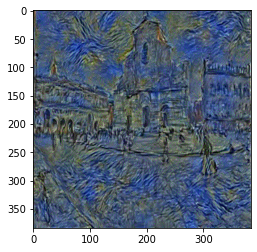

In [ ]:
shape = (384, 384)
style_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/300px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg"
content_url = "https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcR-TANhdLgAwXzB3GPXapuL9kGB-8WD1DFHzA&usqp=CAU"

dataset = ImageDataset(content_url=content_url, style_url=style_url, shape=shape)
neural_transfer = NeuralStyleTransfer(shape=shape)
logger = TensorBoardLogger("logs", name="baseline")

trainer = pl.Trainer(
    gpus=1, max_epochs=5000, logger=logger, checkpoint_callback=False, progress_bar_refresh_rate=100
)
trainer.fit(neural_transfer, dataset)

image = neural_transfer()
plt.imshow(image)


# Credits
* Official PyTorch style-transfer example: https://pytorch.org/tutorials/advanced/neural_style_tutorial.html
* Pluralsight example: https://www.pluralsight.com/guides/artistic-neural-style-transfer-with-pytorch
* YouTube video explanation: https://youtu.be/UFffxcCQMPQ
* YouTube video explanation: https://www.youtube.com/watch?v=LoePx3QC5Js&t=718s
* YouTube video explanation: https://www.youtube.com/watch?v=0tTRA3emrr4&t=635s